# Benchmarking models at locating spatial expression of cell types with scRNA-seq reference and Visium spatial (mouse brain)

In [1]:
import sys, ast, os
import time
import pickle
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import os
from plotnine import *
import matplotlib.pyplot as plt 
import matplotlib
data_type = 'float32'

# this line should go before importing pycell2location
os.environ["THEANO_FLAGS"] = 'device=cuda0,floatX=' + data_type + ',force_device=True'
#os.environ["THEANO_FLAGS"] = 'device=cpu,floatX=float32,openmp=True,force_device=True'
#os.environ["OMP_NUM_THREADS"] = '8'
# /nfs/team283/vk7/software/miniconda3farm5/envs/cellpymc/bin/pip install git+https://github.com/vitkl/cell2location.git
sys.path.insert(1, '/nfs/team205/vk7/sanger_projects/cell2location/')

import pycell2location
#import pycell2location.models as c2l
#import pycell2location.plt as c2lpl
#import pycell2location.cluster_averages 
#import pycell2location

from matplotlib import rcParams
import seaborn as sns

# scanpy prints a lot of warnings
import warnings
warnings.filterwarnings('ignore')

/nfs/team283/vk7/software/miniconda3farm5/envs/cellpymc/lib/python3.7/site-packages/theano/gpuarray/dnn.py:184: UserWarning: Your cuDNN version is more recent than Theano. If you encounter problems, try updating Theano or downgrading cuDNN to a version >= v5 and <= v7.
  warnings.warn("Your cuDNN version is more recent than "
Using cuDNN version 7605 on context None
Mapped name None to device cuda0: Tesla V100-SXM2-32GB (0000:62:00.0)


`THEANO_FLAGS='force_device=True'` forces the package to use GPU. Pay attention to error messages that might indicate theano failed to initalise the GPU.   
Do not forget to change `device=cuda0` to your available GPU id. Use `device=cuda` / `device=cuda0` if you have just one locally or if you are requesting one GPU via HPC cluster job.    
You should see a message similar to the one below confirming that `theano` started using the GPU:
```
Using cuDNN version 7605 on context None
Mapped name None to device cuda0: Tesla V100-SXM2-32GB (0000:89:00.0)
```

### Outline

1. Loading Visium data and single cell reference
2. Show UMAP of cells and locations
3. cell2location analysis in one step
4. Automatic discrete region identification by clustering cell densities
5. Visualize cell type density gradients using diffusion maps
6. Identify co-occuring cell type combinations using matrix factorisation

## 1. Loading Visium data and single cell reference

First let's read spatial Visium data from 10X Space Ranger output. Here we load sample annotations.

In [2]:
sp_data_folder = '/nfs/team205/vk7/sanger_projects/cell2location/notebooks/data/viseum_cortex_trial/'
sc_data_folder = '/nfs/team205/vk7/sanger_projects/cell2location/notebooks/data/processed_data/'
results_folder = '/nfs/team205/vk7/sanger_projects/cell2location/notebooks/results/mouse_viseum_snrna/'

sample_data = pd.read_csv(sp_data_folder + 'Visum_mouse.csv')

In [3]:
sample_data

,sample_name,sample_name2,image_name,slide,position
0,ST8059048,Visium-28C,mouse_brain_he_Library_028_C05717_020_C1_14460...,C05717-020,C1
1,ST8059049,Visium-28D,mouse_brain_he_Library_028_C05717_020_D1_14460...,C05717-020,D1
2,ST8059050,Visium-28E,mouse_brain_he_Library_028_C05717_020_E1_14460...,C05717-020,E1
3,ST8059051,Visium-29B,mouse_brain_he_Library_029_C05717_021_B1_14460...,C05717-021,B1
4,ST8059052,Visium-29C,mouse_brain_he_Library_029_C05717_021_C1_14460...,C05717-021,C1


Next we load the mRNA count for each Visium slide and corresponding histology images as a list `slides` and as a single anndata object `adata`. We need this redundancy because scanpy plotting over the histology image does not work with multiple sections.   

In [4]:
def read_and_qc(sample_name, path=sp_data_folder + 'rawdata/'):
    
    adata = sc.read_visium(path + str(sample_name),
                           count_file='filtered_feature_bc_matrix.h5', load_images=True)
    adata.obs['sample'] = sample_name
    adata.var['SYMBOL'] = adata.var_names
    adata.var.rename(columns={'gene_ids': 'ENSEMBL'}, inplace=True)
    adata.var_names = adata.var['ENSEMBL']
    adata.var.drop(columns='ENSEMBL', inplace=True)

    # Calculate QC metrics
    sc.pp.calculate_qc_metrics(adata, inplace=True)
    adata.var['mt'] = [gene.startswith('mt-') for gene in adata.var['SYMBOL']]
    adata.obs['mt_frac'] = adata[:, adata.var['mt'].tolist()].X.sum(1).A.squeeze()/adata.obs['total_counts']
    
    # add sample name to obs names
    adata.obs["sample"] = [str(i) for i in adata.obs['sample']]
    adata.obs_names = adata.obs["sample"] \
                          + '_' + adata.obs_names
    adata.obs.index.name = 'spot_id'
    
    return adata

# read first sample
adata = read_and_qc(sample_data['sample_name'][0],
                    path=sp_data_folder + 'rawdata/') 

# read the remaining samples
slides = {}
for i in sample_data['sample_name'][1:]:
    adata_1 = read_and_qc(i, path=sp_data_folder + 'rawdata/') 
    slides[str(i)] = adata_1

adata_0 = adata.copy()
    
# combine individual samples
adata = adata.concatenate(
    list(slides.values()),
    batch_key="sample",
    uns_merge="unique",
    batch_categories=sample_data['sample_name'], 
    index_unique=None
)
obs = adata.obs.merge(sample_data, left_on='sample', right_on='sample_name')
obs.index = adata.obs_names
adata.obs = obs

slides[str(sample_data['sample_name'][0])] = adata_0

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Now let's look at QC: total number of counts and total number of genes per spot

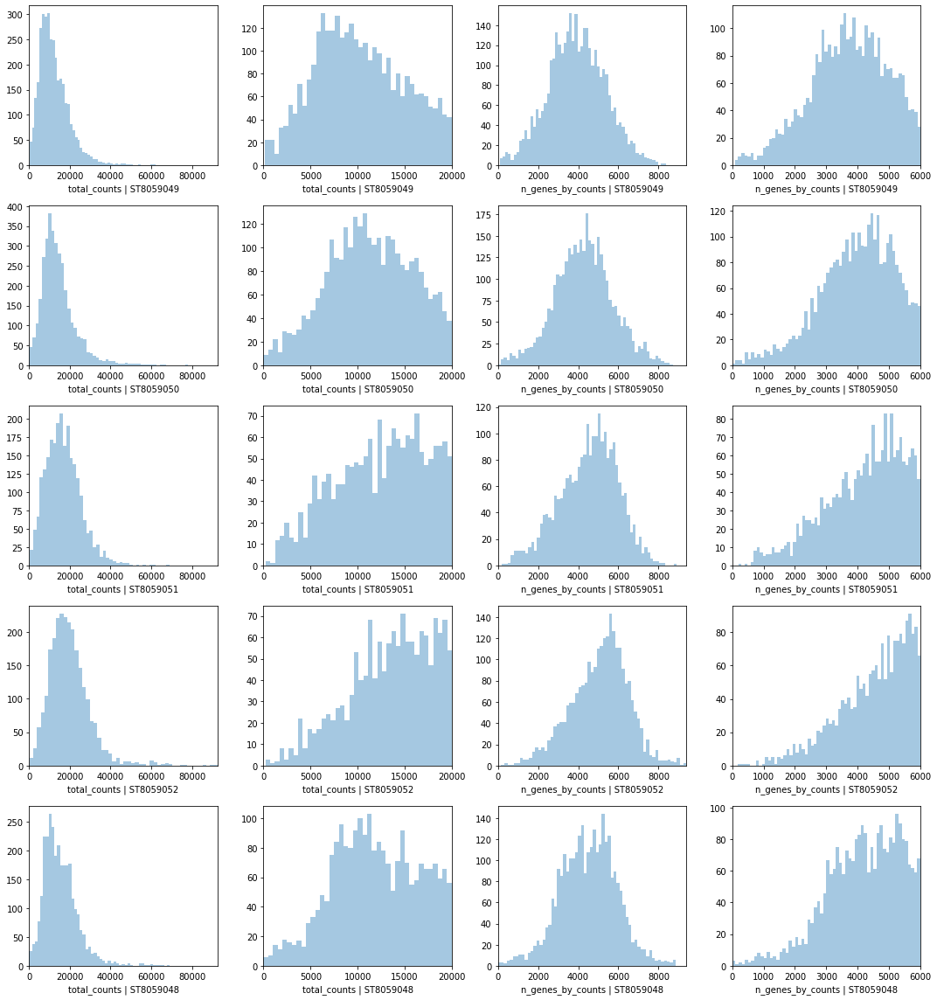

In [5]:
# PLOT QC FOR EACH SAMPLE 
fig, axs = plt.subplots(len(slides), 4, figsize=(15, 4*len(slides)-4))
for i in range(len(slides)):
    #fig.suptitle('Covariates for filtering')
    
    sns.distplot(list(slides.values())[i].obs['total_counts'], 
                 kde=False, ax = axs[i, 0])
    axs[i, 0].set_xlim(0, adata.obs['total_counts'].max())
    axs[i, 0].set_xlabel('total_counts | ' + list(slides.keys())[i])
    
    sns.distplot(list(slides.values())[i].obs['total_counts']\
                 [list(slides.values())[i].obs['total_counts']<20000],
                 kde=False, bins=40, ax = axs[i, 1])
    axs[i, 1].set_xlim(0, 20000)
    axs[i, 1].set_xlabel('total_counts | ' + list(slides.keys())[i])
    
    sns.distplot(list(slides.values())[i].obs['n_genes_by_counts'],
                 kde=False, bins=60, ax = axs[i, 2])
    axs[i, 2].set_xlim(0, adata.obs['n_genes_by_counts'].max())
    axs[i, 2].set_xlabel('n_genes_by_counts | ' + list(slides.keys())[i])
    
    sns.distplot(list(slides.values())[i].obs['n_genes_by_counts']\
                 [list(slides.values())[i].obs['n_genes_by_counts']<6000],
                 kde=False, bins=60, ax = axs[i, 3])
    axs[i, 3].set_xlim(0, 6000)
    axs[i, 3].set_xlabel('n_genes_by_counts | ' + list(slides.keys())[i])
    
plt.tight_layout()

... storing 'sample' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical


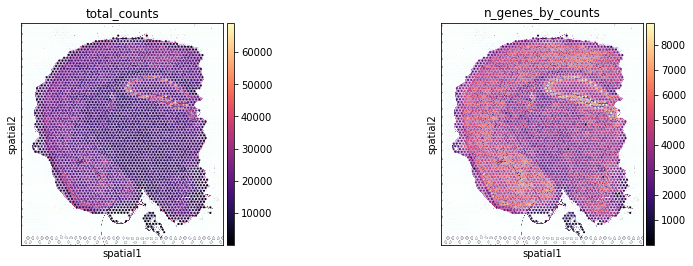

In [6]:
sc.pl.spatial(slides['ST8059048'], img_key = "hires", cmap='magma',
              color=['total_counts', 'n_genes_by_counts'], size=1,
              gene_symbols='SYMBOL')

Here we show how to use scanpy to plot results over histology section using anndata object from one section, and 

Trying to set attribute `.obs` of view, copying.
... storing 'sample' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sample_name' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sample_name2' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'image_name' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'slide' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'position' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'feature_types' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'genome' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'SYMBOL' as categorical


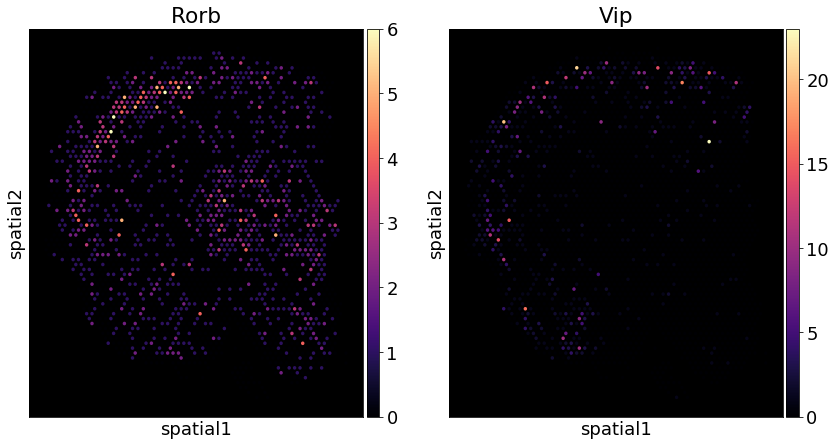

In [7]:
rcParams["axes.facecolor"] = "black"
rcParams["figure.figsize"] = [6,7]
rcParams["font.size"] = 18

sc.pl.spatial(adata[adata.obs["sample"]==adata.obs["sample"].unique()[0], :], 
              color=["Rorb", "Vip"], img_key=None, #size=1,
              vmin=0, cmap='magma', #vmax=3.8,
              gene_symbols='SYMBOL'
             )

In [8]:
## snRNA reference (raw counts)
adata_snrna_raw = anndata.read_h5ad(sc_data_folder + "snRNA_s144600_raw_20200128.h5ad")

## Cell type annotations
labels = pd.read_csv(results_folder + 'snRNA_annotation_20200229.csv', index_col=0)

In [9]:
adata_snrna_raw = adata_snrna_raw[~adata_snrna_raw.obs['sample'].isin(['nan']),]

In [10]:
labels

,annotation_1,seurat_clusters
cell,,
5705STDY8058280_AAACCCAAGGAAGTAG-1,Ext_L25,11
5705STDY8058280_AAACCCAAGGGCAGTT-1,Ext_L56,2
5705STDY8058280_AAACCCAAGGTTGTTC-1,Ext_Thal_1,19
5705STDY8058280_AAACCCAAGTTAACAG-1,Ext_L5_1,48
5705STDY8058280_AAACCCACAACAGATA-1,Ext_Thal_2,25
...,...,...
5705STDY8058285_TTTGTTGCATTGCCGG-1,Ext_Hpc_3,20
5705STDY8058285_TTTGTTGGTAATACCC-1,Astro_1,39
5705STDY8058285_TTTGTTGGTTTCACAG-1,Astro_2,0


Add cell type labels as columns in `adata.obs`

In [11]:
adata_snrna_raw = adata_snrna_raw[labels.index,]
adata_snrna_raw.obs = pd.concat([labels, adata_snrna_raw.obs], axis=1)

Add counts matrix as `adata.raw` 

In [12]:
adata_vis = adata.copy()
adata_snrna_raw.raw = adata_snrna_raw
adata_vis.raw = adata_vis

## 2. Show UMAP of cells and locations

In [13]:
sc.pp.log1p(adata_snrna_raw)
sc.tl.pca(adata_snrna_raw, svd_solver='arpack', n_comps=50)
sc.pp.neighbors(adata_snrna_raw, n_neighbors = 100, n_pcs = 50)
sc.tl.umap(adata_snrna_raw, min_dist = 0.2, spread = 4)

... storing 'annotation_1' as categorical


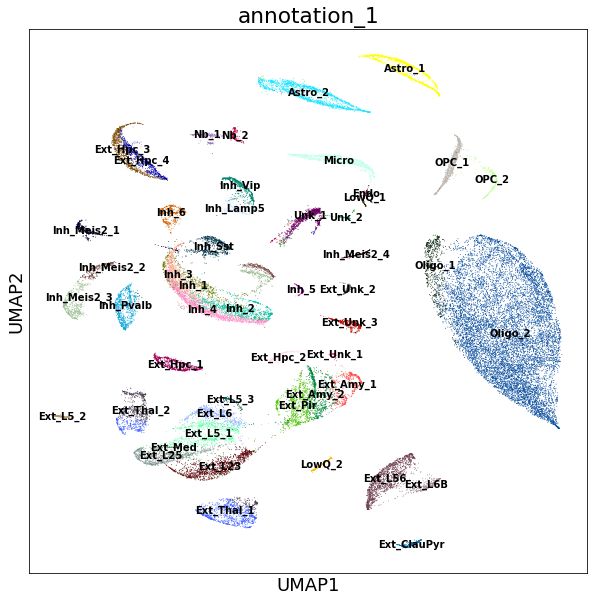

In [14]:
rcParams['figure.figsize'] = 10, 10
rcParams["axes.facecolor"] = "white"
sc.pl.umap(adata_snrna_raw, color=['annotation_1'],
           color_map = 'RdPu', ncols = 1, legend_loc='on data',
           legend_fontsize=10)

Now we look at the UMAP of Visium spots

... storing 'sample' as categorical
... storing 'sample_name' as categorical
... storing 'sample_name2' as categorical
... storing 'image_name' as categorical
... storing 'slide' as categorical
... storing 'position' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical


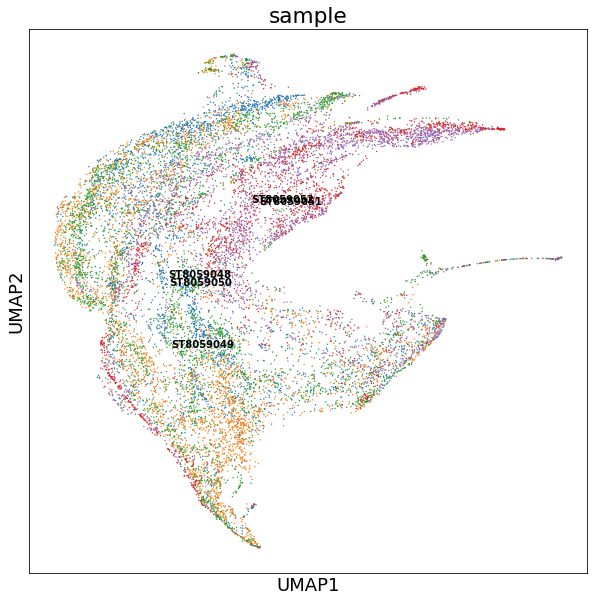

In [15]:
sc.tl.pca(adata_vis, svd_solver='arpack', n_comps=50)
sc.pp.neighbors(adata_vis, n_neighbors = 100, n_pcs = 50)
sc.tl.umap(adata_vis, min_dist = 0.2, spread = 4)

rcParams['figure.figsize'] = 10, 10
rcParams["axes.facecolor"] = "white"
sc.pl.umap(adata_vis, color=['sample'],
           color_map = 'RdPu', ncols = 1, legend_loc='on data',
           legend_fontsize=10)

# 3. cell2location analysis in one step

Here we show how to perform the first step in one function run - train cell2location model to learn cell locations. Results are shown below and saved to:  

In [16]:
results_folder + 'std_model/'

'/nfs/team205/vk7/sanger_projects/cell2location/notebooks/results/mouse_viseum_snrna/std_model/'

In [ ]:
sc.settings.set_figure_params(dpi = 70, color_map = 'RdPu', dpi_save = 260,
                              vector_friendly = True, format = 'pdf',
                              facecolor='white')

r = pycell2location.run_cell2location(
      sc_data=adata_snrna_raw, 
      sp_data=adata_vis,
      model_name='CoLocationModelNB4V2',
      verbose=True, return_all=True,

      summ_sc_data_args={'cluster_col': "annotation_1"},

      train_args={'use_raw': True,
                  'n_iter': 20000, 'learning_rate': 0.005,
                  'sample_prior': False, # set to false for large spatial data 
                  'readable_var_name_col': 'SYMBOL',
                  'sample_name_col': 'sample'},

      posterior_args={'n_samples': 500},

      export_args={'path': results_folder + 'std_model/', 
                   'run_name_suffix': '',
                   'save_model': False,
                   'scanpy_coords_name': 'spatial', 'export_q05': True},

      model_kwargs={
                    'cell_number_prior': {
                        # Use visual inspection of the tissue image to determine the number of cells per spot
                        'cells_per_spot': 8, 
                        #
                        'combs_per_spot': 4, 
                        #
                        'factors_per_combs': 2.5,
                        'cells_mean_var_ratio': 1, 'combs_mean_var_ratio': 1, 'factors_mean_var_ratio': 1},
                    'gene_level_prior':{'mean': 1/2, 'sd': 1/4, 'mean_var_ratio': 1},
                    'n_comb': 50, 'spot_fact_mean_var_ratio': 1/2,
                    'phi_hyp_prior':{'mean': 3, 'sd': 1}
      }
)

Trained model object can be pulled from `r['mod']`, cell locations are added to `r['sp_data']` as columns of `sp_data.obs` and all paramters of the model are exported to `sp_data.uns['mod']`. This anndata object and a csv file `W.csv` / `W_q05.csv` with cell locations are always saved to the results directory. 

When `'save_model': True`, the trained model `r['mod']` is also saved as a pickle file. You can load the model later and continue training. 

Now we need to check if our model has trained successfully by looking at the loss / cost function over training iterations. This plot omits the first 20% of training iterations during which loss changes by orders of magnitude.

#### Evaluating training

In [16]:
r = {'run_name': 'CoLocationModelNB4V2_50clusters_14968locations_11945genes'}

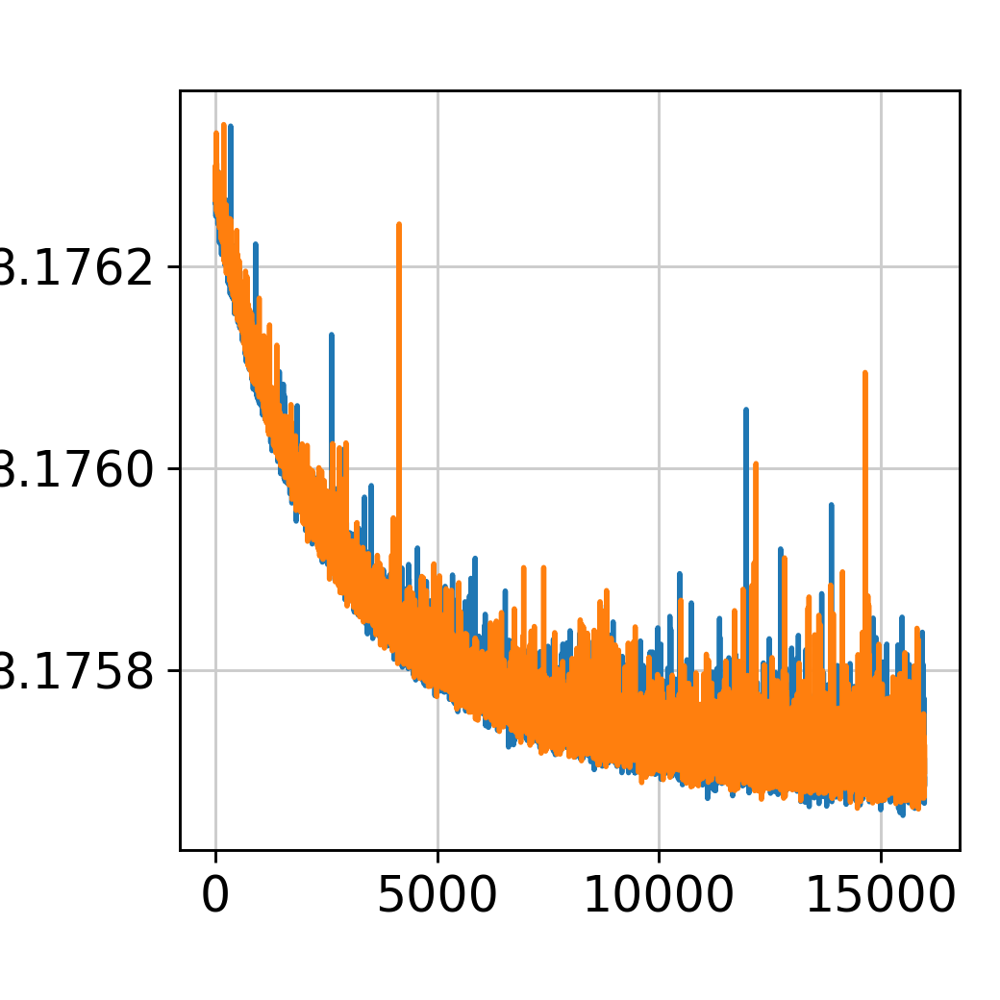

In [17]:
from IPython.display import Image
Image(filename=results_folder + 'std_model/'+r['run_name']+'/plots/training_history_without_first_20perc.png',
      width=400)

We also need to evaluate the reconstruction accuracy or how well cell types and uniform background explain spatial data bu comparing expected value of the model (Poisson mean) to observed count of each gene across locations. The ideal case is perfect diagonal plot.

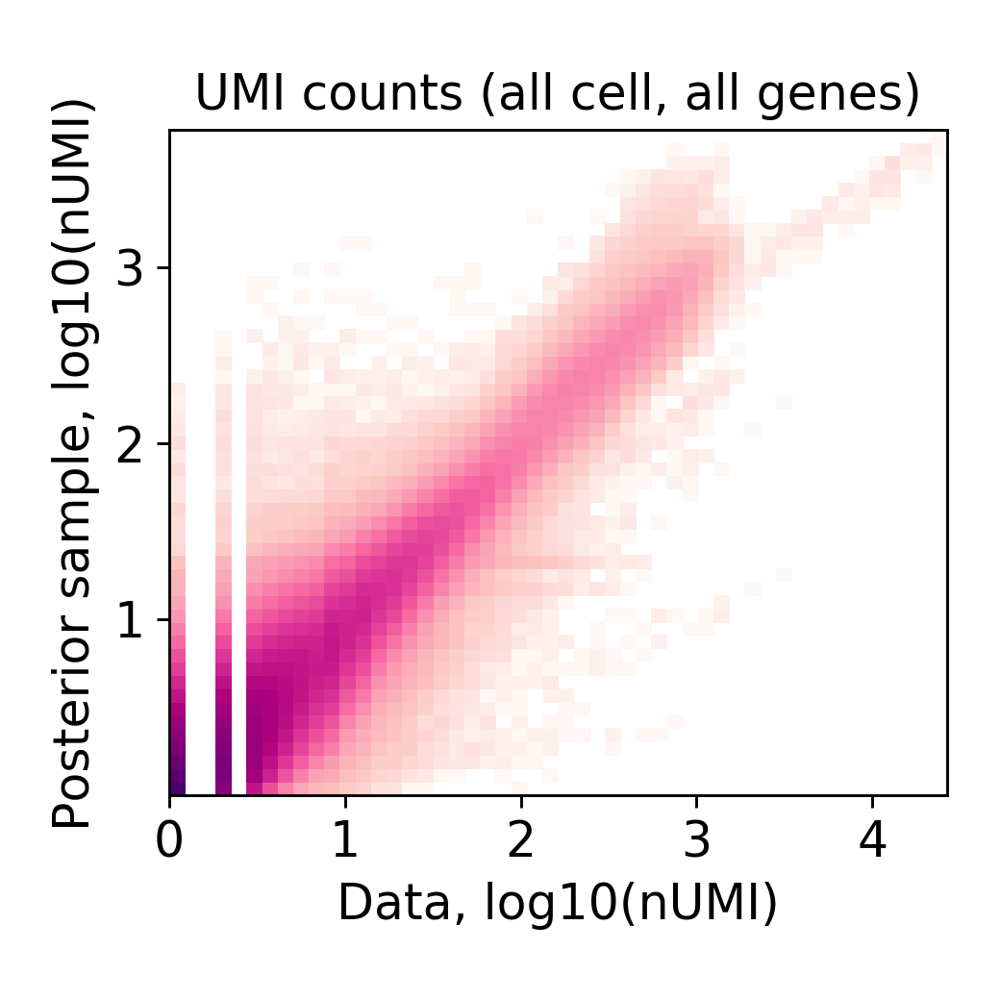

In [18]:
Image(filename=results_folder + 'std_model/'+r['run_name']+'/plots/data_vs_posterior_mean_Poisson_rate.png',
      width=400)

Finally, we need to evaluate robustness of the identified locations by comparing consistency of inferred locations between two independent training restarts.

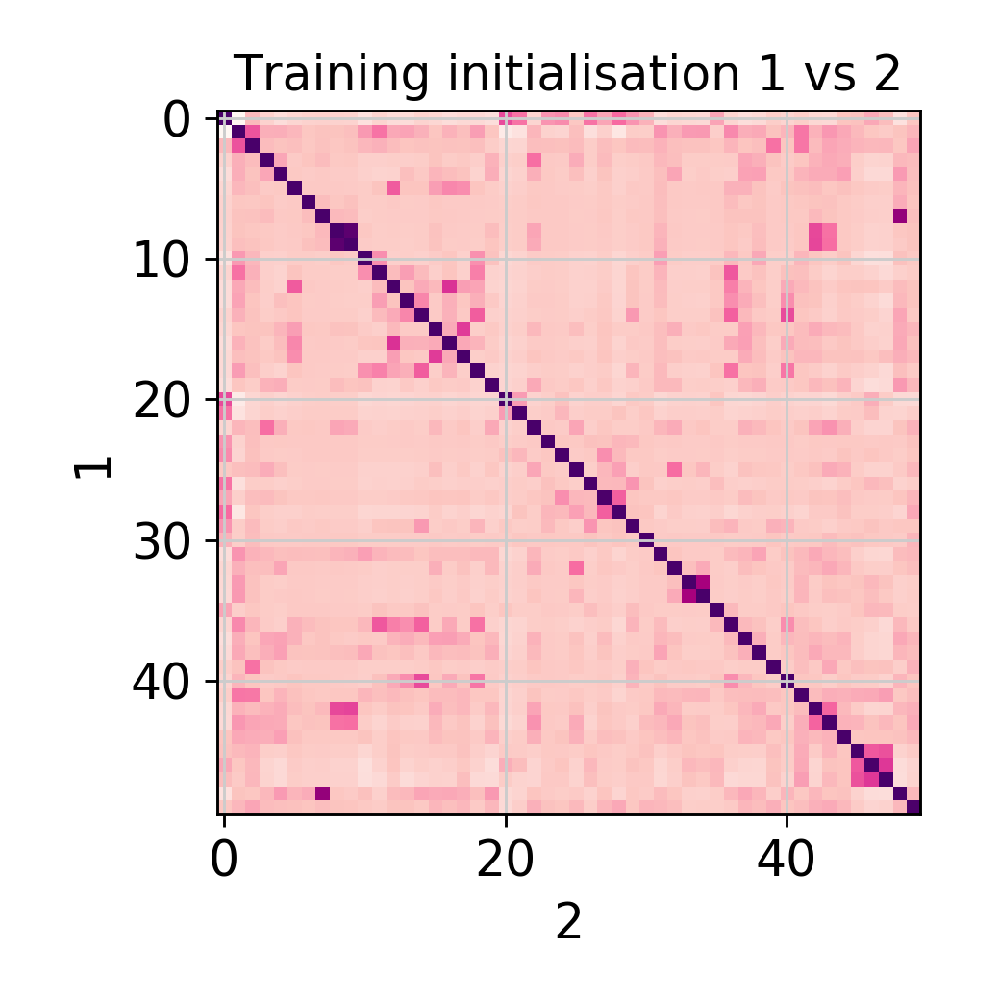

In [19]:
Image(filename=results_folder + 'std_model/'+r['run_name']+'/plots/evaluate_stability.png',
      width=400)

#### Loading saved results

We can load our model and associated object after training (this also needs a GPU to be available and we need to know the analysis name):

pickle_model = results_folder + 'std_model/'+r['run_name']+'/model_.p'
r = pickle.load(open(pickle_model, "rb"))

adata_vis = r['sp_data']

Alternatively we can load the results of the model saved into `sp_data`:

In [20]:
sp_data_file = results_folder + 'std_model/'+r['run_name']+'/sp.h5ad'
adata_vis = anndata.read(sp_data_file)

#### Advanced plotting of cell locations

Now we add cell locations to each slide to plot them over histology images.

In [21]:
col_sel = ['mean_nUMI_factors' in i for i in adata_vis.obs.columns]
for s in slides.keys():
    obs = adata_vis.obs.loc[:,col_sel].loc[slides[s].obs.index,:]
    slides[s].obs[obs.columns] = obs
    
col_sel = ['q05_nUMI_factors' in i for i in adata_vis.obs.columns]
for s in slides.keys():
    obs = adata_vis.obs.loc[:,col_sel].loc[slides[s].obs.index,:]
    slides[s].obs[obs.columns] = obs
    
col_sel = ['q95_nUMI_factors' in i for i in adata_vis.obs.columns]
for s in slides.keys():
    obs = adata_vis.obs.loc[:,col_sel].loc[slides[s].obs.index,:]
    slides[s].obs[obs.columns] = obs
    
col_sel = ['mean_spot_factors' in i for i in adata_vis.obs.columns]
for s in slides.keys():
    obs = adata_vis.obs.loc[:,col_sel].loc[slides[s].obs.index,:]
    slides[s].obs[obs.columns] = obs
    
col_sel = ['q05_spot_factors' in i for i in adata_vis.obs.columns]
for s in slides.keys():
    obs = adata_vis.obs.loc[:,col_sel].loc[slides[s].obs.index,:]
    slides[s].obs[obs.columns] = obs
    
col_sel = ['q95_spot_factors' in i for i in adata_vis.obs.columns]
for s in slides.keys():
    obs = adata_vis.obs.loc[:,col_sel].loc[slides[s].obs.index,:]
    slides[s].obs[obs.columns] = obs

Here we visualise locations of multiple cell types at once.

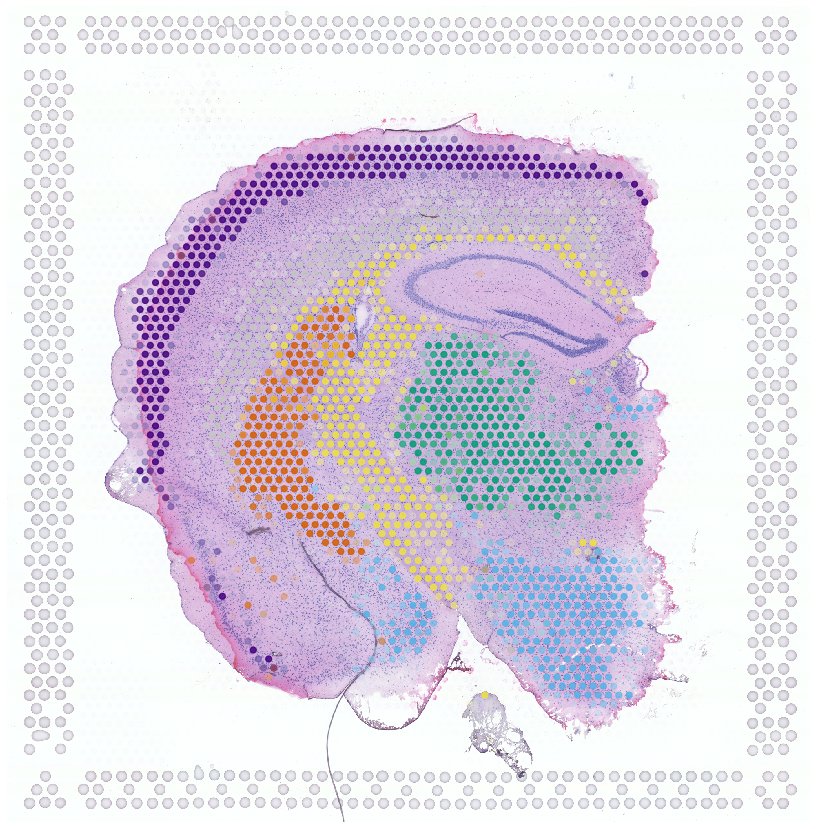

In [26]:
from pycell2location.plt.mapping_video import plot_contours

# select up to 6 clusters 
sel_clust = ['Oligo_2', 'Inh_Meis2_3', 'Inh_4', 'Ext_Thal_1', 'Ext_L23', 'Ext_L56']
sel_clust_col = ['mean_nUMI_factors' + str(i) for i in sel_clust]
s = 'ST8059048'

rcParams["figure.figsize"] = [15,15]
plot_contours(slides[s].obs[sel_clust_col], 
              coords=slides[s].obsm['spatial'] \
                      * list(slides[s].uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef'], 
              show_img=True, img_alpha=0.8,
              img=list(slides[s].uns['spatial'].values())[0]['images']['hires'],
              circle_diameter=6, alpha_scaling=0.6)

Now we plot the 5% quantile of the posterior distribution on the number of UMI which shows the location only when the model has high confidence.

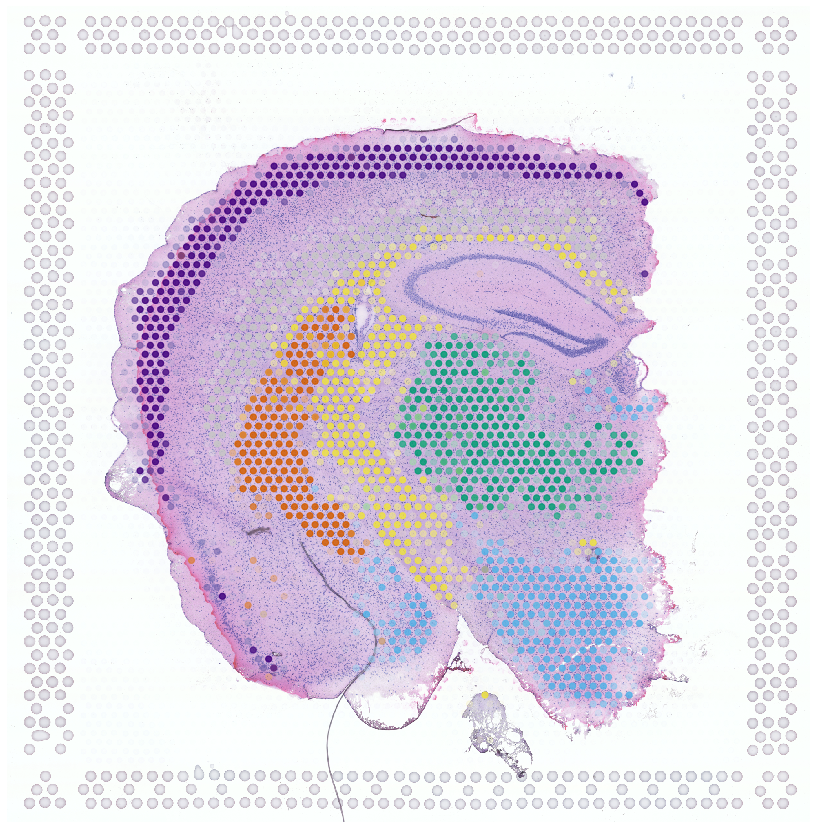

In [25]:
# select up to 6 clusters 
sel_clust = ['Oligo_2', 'Inh_Meis2_3', 'Inh_4', 'Ext_Thal_1', 'Ext_L23', 'Ext_L56']
sel_clust_col = ['q05_nUMI_factors' + str(i) for i in sel_clust]
s = 'ST8059048'

rcParams["figure.figsize"] = [15,15]
plot_contours(slides[s].obs[sel_clust_col], 
              coords=slides[s].obsm['spatial'] \
                      * list(slides[s].uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef'], 
              show_img=True, img_alpha=0.8,
              img=list(slides[s].uns['spatial'].values())[0]['images']['hires'],
              circle_diameter=6, alpha_scaling=0.6)

Here we use standard scanpy pipeline to plot cell locations over histology images:

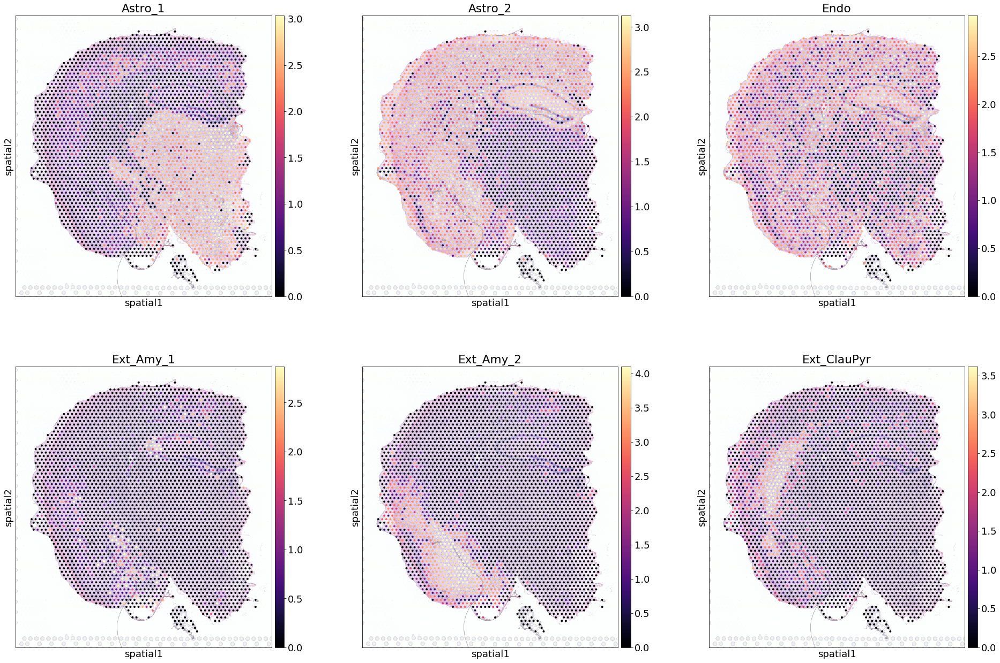

In [27]:
rcParams["axes.facecolor"] = "white"
rcParams["figure.figsize"] = [10,10]
rcParams["font.size"] = 18

s = 'ST8059048'
sel_clust_col = ['q05_nUMI_factors' in i for i in slides[s].obs.columns]
sel_clust_col = slides[s].obs.columns[sel_clust_col]
from re import sub # create nice names
sel_clust = [sub('q05_nUMI_factors', '', i) for i in sel_clust_col]

# log-transform and save with nice names
slides[s].obs[sel_clust] = np.log10(slides[s].obs[sel_clust_col])

sc.pl.spatial(slides[s], cmap='magma',
              color=sel_clust[0:6], # limit size in this notebook
              ncols=3, 
              size=0.8, img_key='hires', 
              alpha_img=0.5,
              vmin=0, vmax='p99.0'
             )

## 4. Automatic discrete region identification by clustering cell densities
We find regions by clustering spots based on inferred molecule contributions of each cell type. We use standard Leiden clustering. Results are saved in `adata_vis.obs['leiden']`.

In [29]:
sample_type = 'q05_nUMI_factors'
col_ind = [sample_type in i for i in adata_vis.obs.columns.tolist()]
adata_vis.obsm[sample_type] = adata_vis.obs.loc[:,col_ind].values

# compute KNN using the cell2location output
sc.pp.neighbors(adata_vis, use_rep=sample_type,
                n_neighbors = 38)

# Cluster spots into regions using scanpy
sc.tl.leiden(adata_vis, resolution=1)

In [30]:
adata_vis.obs["region_cluster"] = adata_vis.obs["leiden"]
adata_vis.obs["region_cluster"] =  adata_vis.obs["region_cluster"].astype("category")

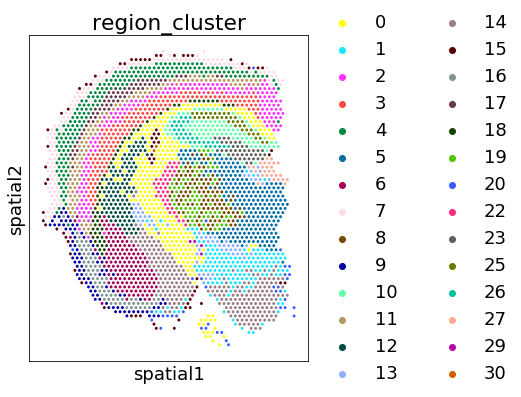

Trying to set attribute `.uns` of view, copying.


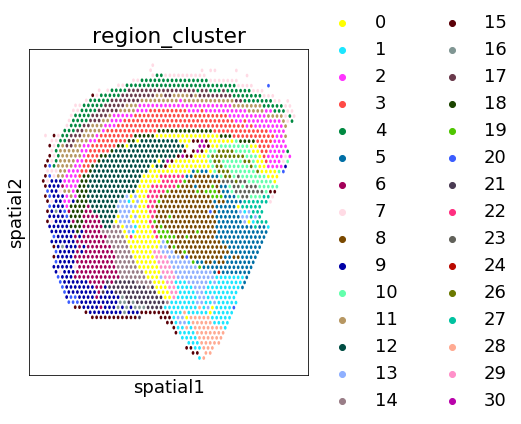

In [37]:
rcParams["figure.figsize"] = [5,6]
rcParams["axes.facecolor"] = "white"
sc.pl.spatial(adata_vis[adata_vis.obs["sample"]=="ST8059048"], 
              color=["region_cluster"], img_key=None
            );
sc.pl.spatial(adata_vis[adata_vis.obs["sample"]=="ST8059051"], 
              color=["region_cluster"], img_key=None
            )

### Export regions for import to 10X Loupe Browser

In [32]:
# add binary labels for each region
region_cluster_bin = pd.get_dummies(adata_vis.obs['region_cluster'], columns=['region_cluster']).values
colnames = adata_vis.obs['region_cluster'].cat.categories
colnames = ['r' + str(i) for i in colnames]
region_cluster_bin = pd.DataFrame(region_cluster_bin, index=adata_vis.obs_names,
                                  columns=colnames)
region_cluster_bin['region_cluster'] = adata_vis.obs['region_cluster']

In [33]:
# add binary labels for each region
region_cluster_bin = adata_vis.obs[['region_cluster']]
#colnames = adata_vis.obs['region_cluster'].cat.categories
#colnames = ['r' + str(i) for i in colnames]
#region_cluster_bin = pd.DataFrame(region_cluster_bin, index=adata_vis.obs_names,
#                                  columns=colnames)
#region_cluster_bin['region_cluster'] = adata_vis.obs['region_cluster']

# save maps for each sample separately
sam = np.array(adata_vis.obs['sample'])

for i in np.unique(sam):
    
    s1 = region_cluster_bin
    s1 = s1.loc[sam == i]
    s1.index = [x[10:] for x in s1.index]
    s1.index.name = 'Barcode'
    
    #w1 = r['mod'].spot_factors_df.loc[sam == i] # color mapping does not work
    #w1.index = [x[10:] for x in w1.index]
    
    s1.to_csv(results_folder + 'std_model/'+r['run_name']+'/region_cluster29_' + i + '.csv')
    #w1.to_csv(results_folder + 'std_model/'+r['run_name']+'/W_V7_V2_' + i + '.csv')

## 5. Visualize cell type density gradients using diffusion maps

Here we use the diffusion maps approach to visualize cell type density gradients. This allows describing how cell composition of spots transitions as you move through the tissue and shows which tissue regions are connected in terms of their cell composition.

In [34]:
sc.tl.diffmap(adata_vis)

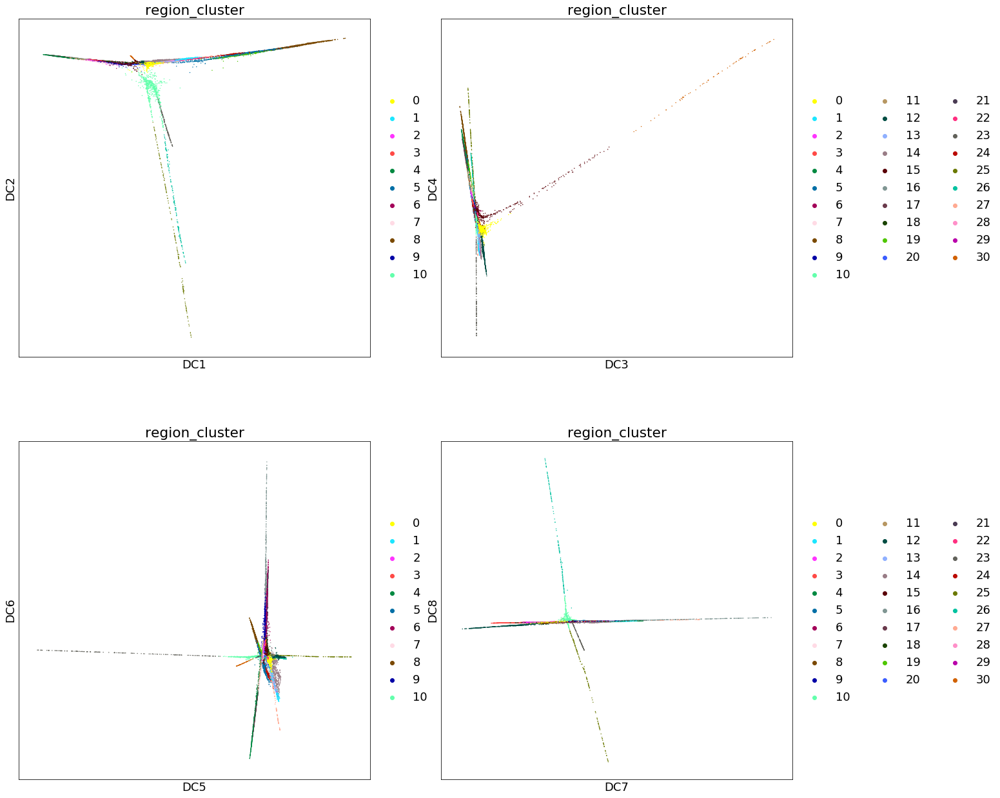

In [35]:
rcParams["axes.facecolor"] = "white"
rcParams["figure.figsize"] = [10,10]
sc.pl.diffmap(adata_vis, color=['region_cluster'],
              components=['1,2', '3,4', '5,6', '7,8'], ncols=2)

## 6. Identify co-occuring cell type combinations using matrix factorisation

Here we use inferred cell densities as input to non-negative matrix factorisation to identify co-occuring cell type combinations.

In [38]:
# number of cell type combinations - educated guess 
n_fact = int(30)

# extract cell density parameter from cell2location
X_data = adata_vis.uns['mod']['post_sample_means']['spot_factors']

import pycell2location.models as c2l
# create model class
mod_sk = c2l.CellNeighbourhood_sklearnNMF(n_fact, X_data, 
        n_iter = 10000,
        verbose = True,
        var_names=adata_vis.uns['mod']['fact_names'],
        obs_names=adata_vis.obs_names,
        fact_names=['fact_' + str(i) for i in range(n_fact)],
        sample_id=None,
        init='random', random_state=0, #alpha=0.1, l1_ratio=0.5,
        nmf_kwd_args={'tol':0.0001})

# train 5 times to evaluate stability
mod_sk.fit(n=5, n_type='restart') 

init_1 - iterations until convergence: 3527
init_2 - iterations until convergence: 3639
init_3 - iterations until convergence: 3580
init_4 - iterations until convergence: 3481
init_5 - iterations until convergence: 3450


None
None
None
None


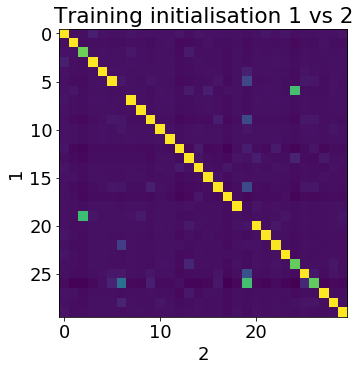

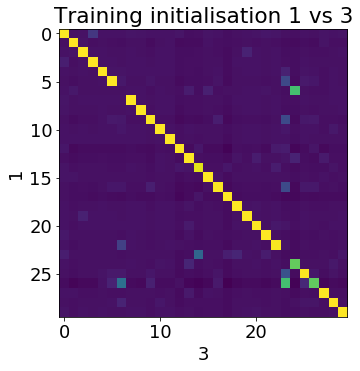

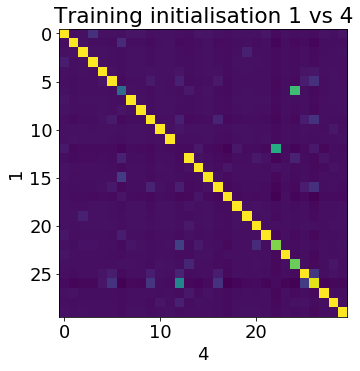

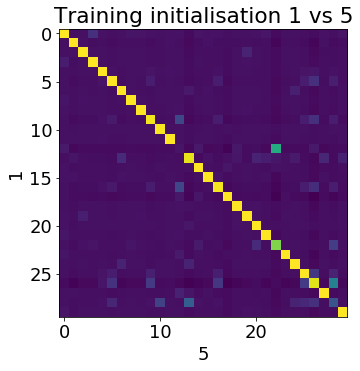

In [39]:
## Do some diagnostics
# evaluate stability by comparing trainin restarts
rcParams["figure.figsize"] = [5.5, 5.5]
mod_sk.evaluate_stability('cell_type_factors', align=True)

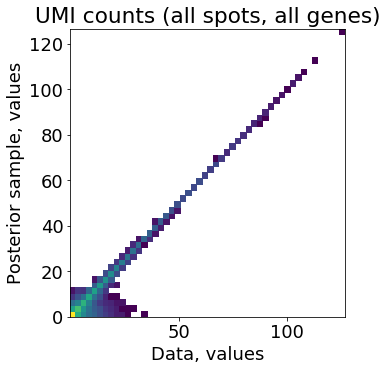

In [40]:
# evaluate accuracy of the model
rcParams["axes.facecolor"] = "white"
rcParams["figure.figsize"] = [5.5, 5.5]
mod_sk.compute_expected()
mod_sk.plot_posterior_mu_vs_data()

In [41]:
# extract parameters into DataFrames
mod_sk.sample2df(node_name='nUMI_factors', gene_node_name = 'cell_type_factors')

# export results to scanpy object
adata_vis = mod_sk.annotate_adata(adata_vis) # as columns to .obs
adata_vis = mod_sk.export2adata(adata_vis, slot_name='mod_sklearn') # as a slot in .uns

# print the fraction of cells of each type located to each combination
mod_sk.print_gene_loadings(loadings_attr='cell_type_fractions',
                         gene_fact_name='cell_type_fractions')

Top loadings by magnitude
---------------------
mean_cell_type_factorsfact_0:	LowQ_1, 0.97	Endo, 0.055	Inh_5, 0.051	Unk_2, 0.033	Micro, 0.01	OPC_2, 0.0089	Ext_L5_3, 0.0049	Nb_2, 0.0036	Astro_1, 0.0029	Oligo_1, 0.00095
---------------------

mean_cell_type_factorsfact_1:	Unk_1, 0.85	Ext_L5_2, 0.031	Ext_L5_3, 0.023	Inh_Sst, 0.02	LowQ_2, 0.017	Ext_ClauPyr, 0.016	Unk_2, 0.013	Inh_5, 0.011	Ext_Med, 0.0046	Endo, 0.0036
---------------------

mean_cell_type_factorsfact_2:	Ext_Hpc_3, 0.95	Ext_Unk_1, 0.077	Nb_1, 0.052	Ext_Hpc_4, 0.033	Ext_L5_3, 0.019	Micro, 0.0053	Ext_ClauPyr, 0.0034	Ext_Hpc_2, 0.0018	Unk_2, 0.0016	Ext_Pir, 0.0013
---------------------

mean_cell_type_factorsfact_3:	Ext_L25, 0.99	Inh_Pvalb, 0.099	Ext_Med, 0.093	Astro_2, 0.045	Inh_Lamp5, 0.026	Endo, 0.022	Ext_ClauPyr, 0.016	Astro_1, 0.013	Micro, 0.0071	Inh_Vip, 0.0051
---------------------

mean_cell_type_factorsfact_4:	Ext_L23, 0.99	Ext_Med, 0.15	Inh_Lamp5, 0.14	Inh_Vip, 0.13	Micro, 0.056	OPC_1, 0.041	Astro_2, 0.038	Endo, 0.038

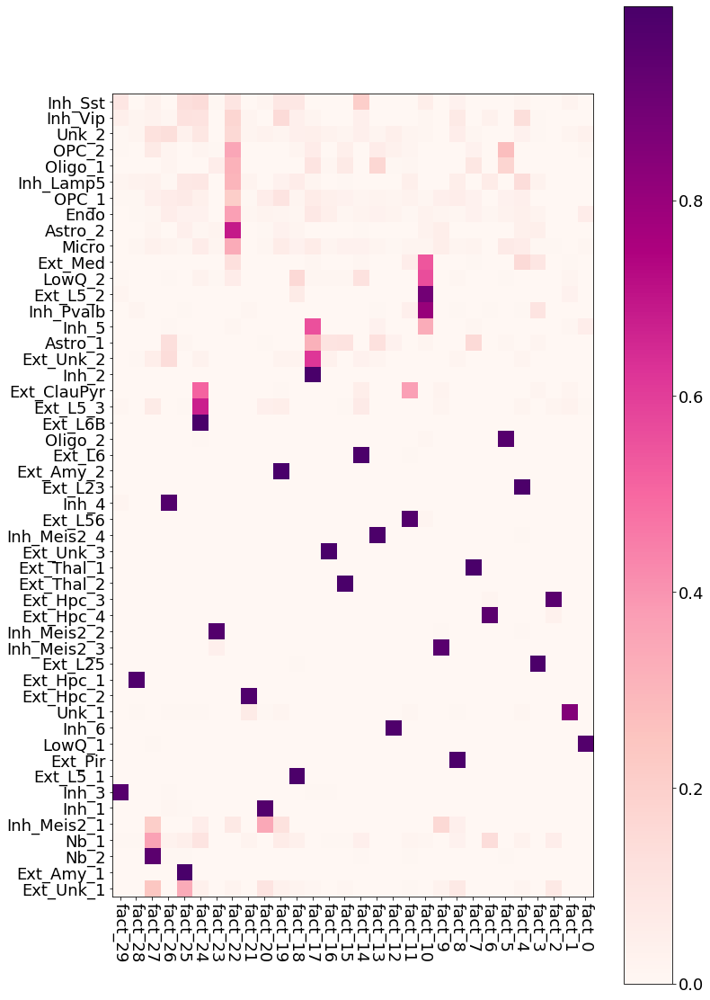

In [42]:
# make nice names
from re import sub
mod_sk.cell_type_fractions.columns = [sub('mean_cell_type_factors', '', i) 
                                      for i in mod_sk.cell_type_fractions.columns]

# plot co-occuring cell type combinations
mod_sk.plot_gene_loadings(mod_sk.var_names_read, mod_sk.var_names_read,
                        fact_filt=mod_sk.fact_filt,
                        loadings_attr='cell_type_fractions',
                        gene_fact_name='cell_type_fractions',
                        cmap='RdPu', figsize=[12, 20])

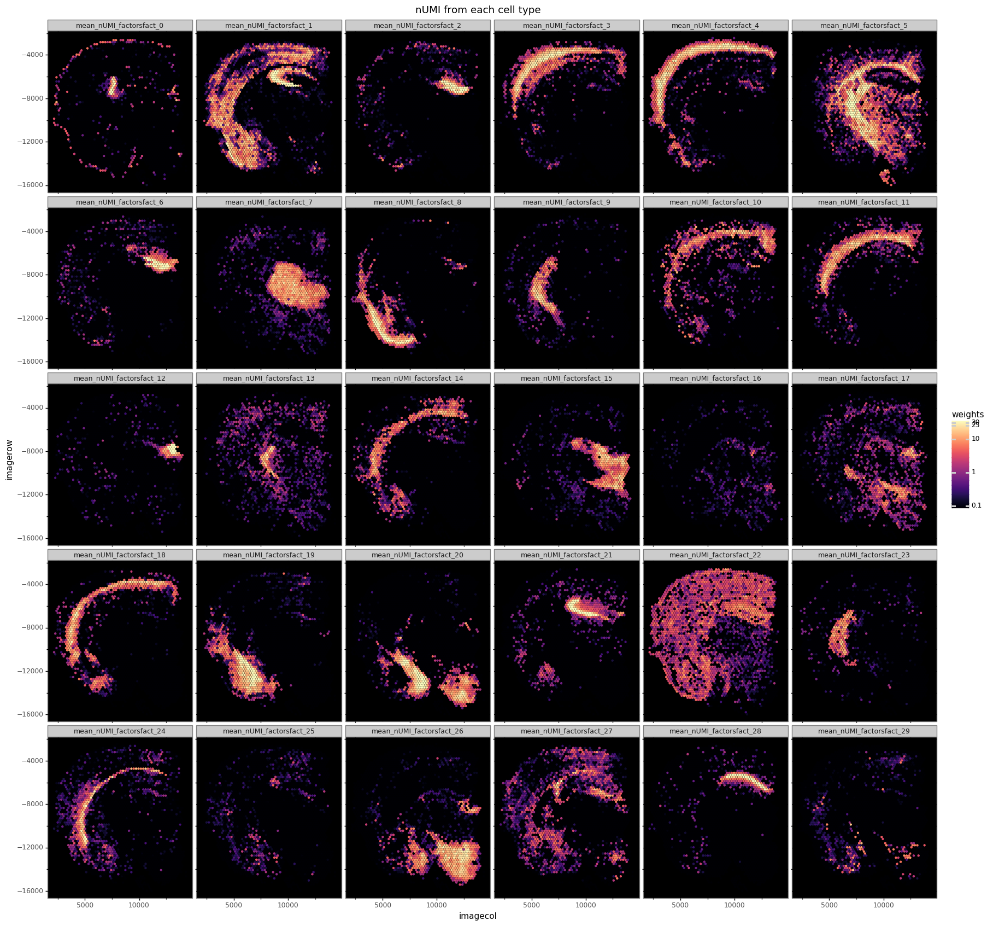

<ggplot: (1415314010617)>

In [46]:
adata_vis.obs['imagecol'] = adata_vis.obsm['spatial'][:,0]
adata_vis.obs['imagerow'] = adata_vis.obsm['spatial'][:,1]
    
# Plotting spatial distribution of region factors:
import pycell2location.plt as c2lpl
import plotnine as pn
c2lpl.plot_factor_spatial(adata=adata_vis, 
                    fact_ind=np.arange(mod_sk.location_factors_df.shape[1]),
                    fact=mod_sk.location_factors_df,
                    cluster_names=mod_sk.location_factors_df.columns,
                    sample_name='ST8059048', samples_col='sample',
                    col_breaks=[0.1, 1, 10, 25], max_col=30,
                    n_columns=6, trans='log'
                   ) + pn.theme(figure_size=(21, 5))

In [47]:
# save co-location models object
def pickle_model(mod, path, file_suffix=''):
    file = path + 'model_' + str(mod.__class__.__name__) + '_' + str(mod.n_fact) + '_' + file_suffix + ".p"
    pickle.dump({'mod': mod, 'fact_names': mod.fact_names}, file = open(file, "wb"))
    print(file)
    
pickle_model(mod_sk, results_folder + 'std_model/'+r['run_name'] + '/', file_suffix='')

/nfs/team205/vk7/sanger_projects/cell2location/notebooks/results/mouse_viseum_snrna/std_model/CoLocationModelNB4V2_50clusters_14968locations_11945genes/model_CellNeighbourhood_sklearnNMF_30_.p


Save resulting adata with clustering, diffusion maps and co-occuring cell type combinations.

In [48]:
adata_file = results_folder \
                + 'std_model/'+r['run_name']+'/sp_with_clusters.h5ad'
adata_vis.write(adata_file)
adata_file

'/nfs/team205/vk7/sanger_projects/cell2location/notebooks/results/mouse_viseum_snrna/std_model/CoLocationModelNB4V2_50clusters_14968locations_11945genes/sp_with_clusters.h5ad'

Modules and their versions used for this analysis

In [49]:
import sys
for module in sys.modules:
    try:
        print(module,sys.modules[module].__version__)
    except:
        try:
            if  type(modules[module].version) is str:
                print(module,sys.modules[module].version)
            else:
                print(module,sys.modules[module].version())
        except:
            try:
                print(module,sys.modules[module].VERSION)
            except:
                pass

ipykernel 5.1.3
ipykernel._version 5.1.3
json 2.0.9
re 2.2.1
IPython 7.11.1
IPython.core.release 7.11.1
logging 0.5.1.2
zlib 1.0
traitlets 4.3.3
six 1.13.0
ipython_genutils 0.2.0
ipython_genutils._version 0.2.0
platform 1.0.8
traitlets._version 4.3.3
decorator 4.4.1
argparse 1.1
pygments 2.5.2
pexpect 4.7.0
ptyprocess 0.6.0
pickleshare 0.7.5
backcall 0.1.0
prompt_toolkit 2.0.10
jedi 0.15.2
parso 0.5.2
urllib.request 3.7
jupyter_client 5.3.4
jupyter_client._version 5.3.4
zmq 18.1.1
ctypes 1.1.0
_ctypes 1.1.0
zmq.backend.cython 40302
zmq.backend.cython.constants 40302
zmq.sugar 18.1.1
zmq.sugar.constants 40302
zmq.sugar.version 18.1.1
jupyter_core 4.6.1
jupyter_core.version 4.6.1
_curses b'2.2'
dateutil 2.8.1
decimal 1.70
_decimal 1.70
distutils 3.7.6
ipywidgets 7.5.1
ipywidgets._version 7.5.1
scanpy 1.5.1
numpy 1.17.3
numpy.core 1.17.3
numpy.core._multiarray_umath 3.1
numpy.lib 1.17.3
numpy.linalg._umath_linalg b'0.1.5'
anndata 0.7.3
h5py 2.10.0
natsort 7.0.0
pandas 1.0.3
pytz 2019.3
cs